In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
%matplotlib inline
figsize = (15,20)


# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

########################################Blob Detector##############################################

# Setup SimpleBlobDetector parameters.
blobParams = cv2.SimpleBlobDetector_Params()

# Change thresholds
blobParams.minThreshold = 30
blobParams.maxThreshold = 255

# Filter by Area.
blobParams.filterByArea = True
blobParams.minArea = 4500   # minArea may be adjusted to suit for your experiment
blobParams.maxArea = 1000000   # maxArea may be adjusted to suit for your experiment

# Filter by Circularity
blobParams.filterByCircularity = True
blobParams.minCircularity = 0.4

# Filter by Convexity
blobParams.filterByConvexity = True
blobParams.minConvexity = 0.87

# Filter by Inertia
blobParams.filterByInertia = True
blobParams.minInertiaRatio = 0.01

# Create a detector with the parameters
blobDetector = cv2.SimpleBlobDetector_create(blobParams)


In [0]:
grid_col_size = 11
grid_row_size = 4 
objp = np.zeros((44, 3), np.float32)
for x in range(0, grid_col_size):
  for y in range(0, grid_row_size):
    objp[4*x+y] = (x*36, y*72 + (x%2)*36, 0)


/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


(21, 44, 3)
(21, 44, 1, 2)
(21, 44, 2)
[[3.13659183e+03 0.00000000e+00 2.01592268e+03]
 [0.00000000e+00 3.14539383e+03 1.48055106e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[ 2.61388652e-01 -1.41220894e+00  1.15708420e-03 -9.09050991e-05
   2.28663590e+00]]


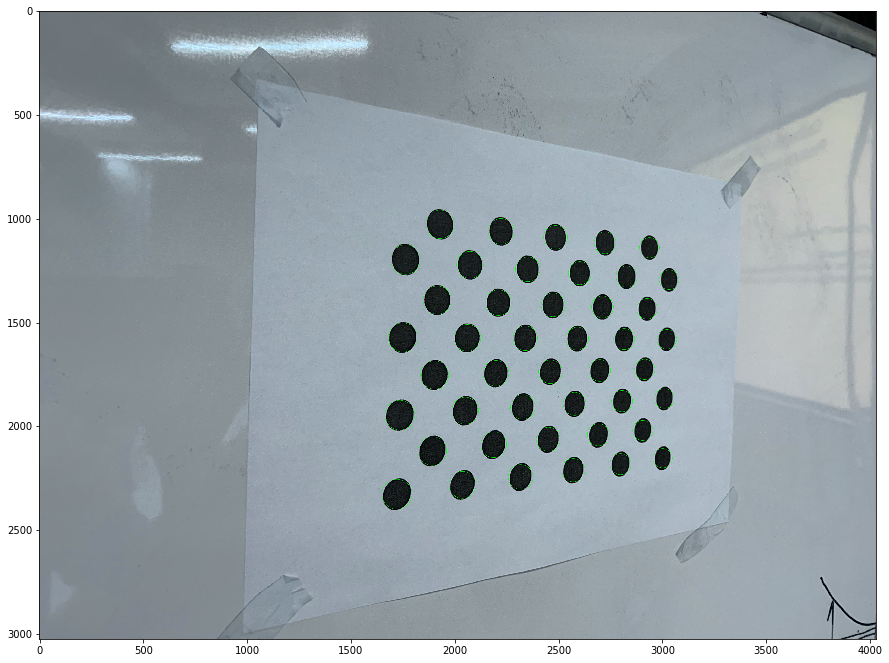

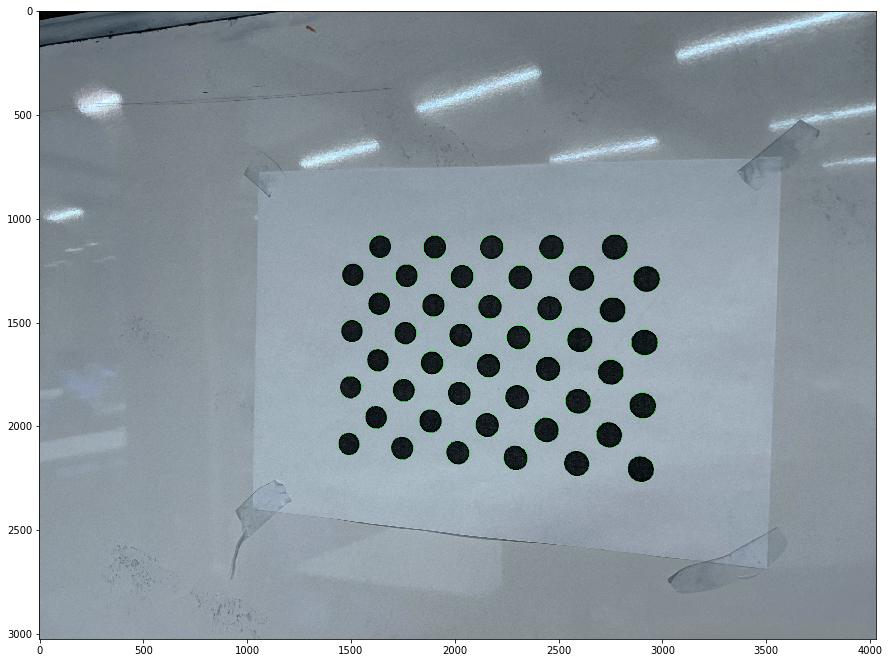

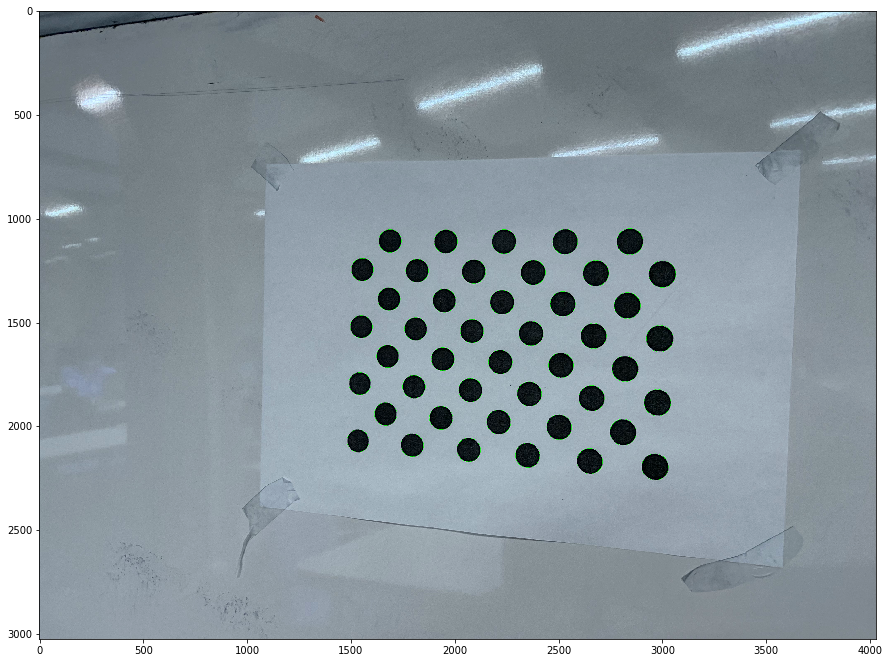

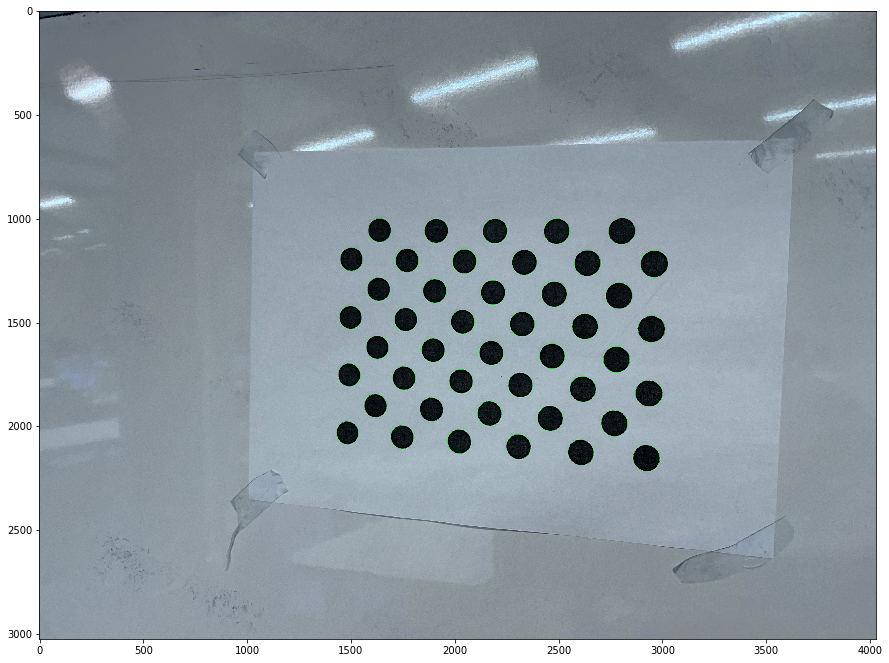

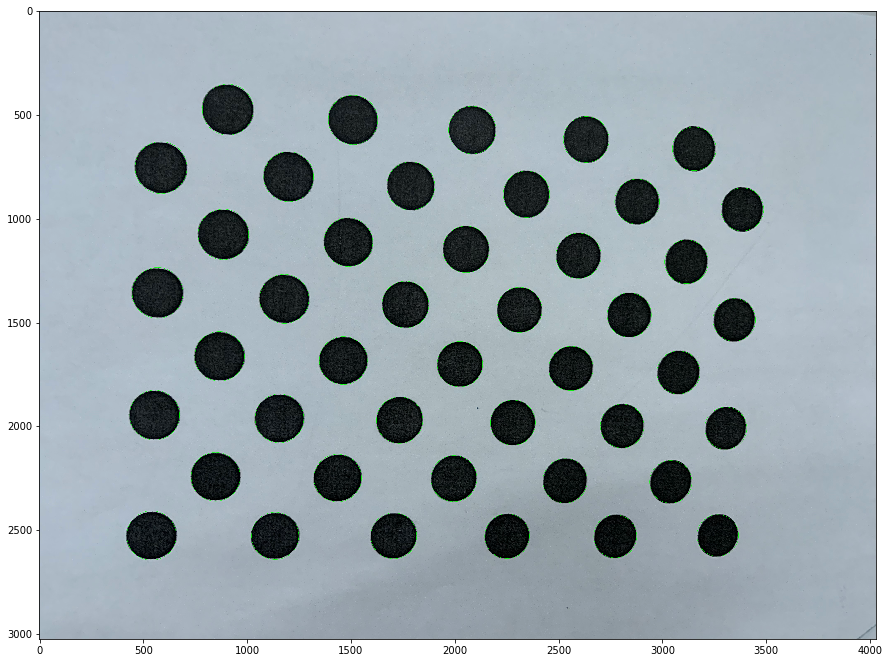

...

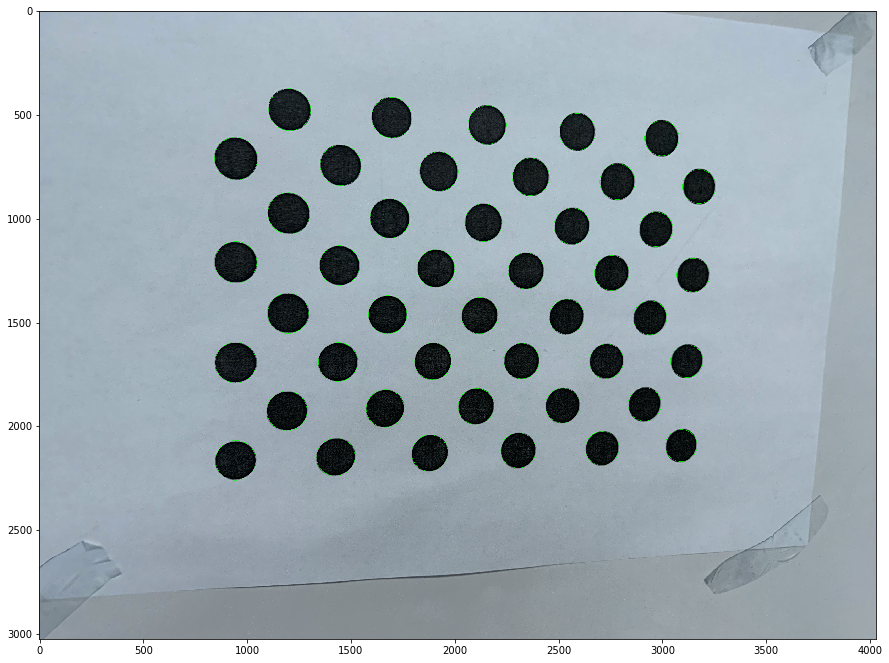

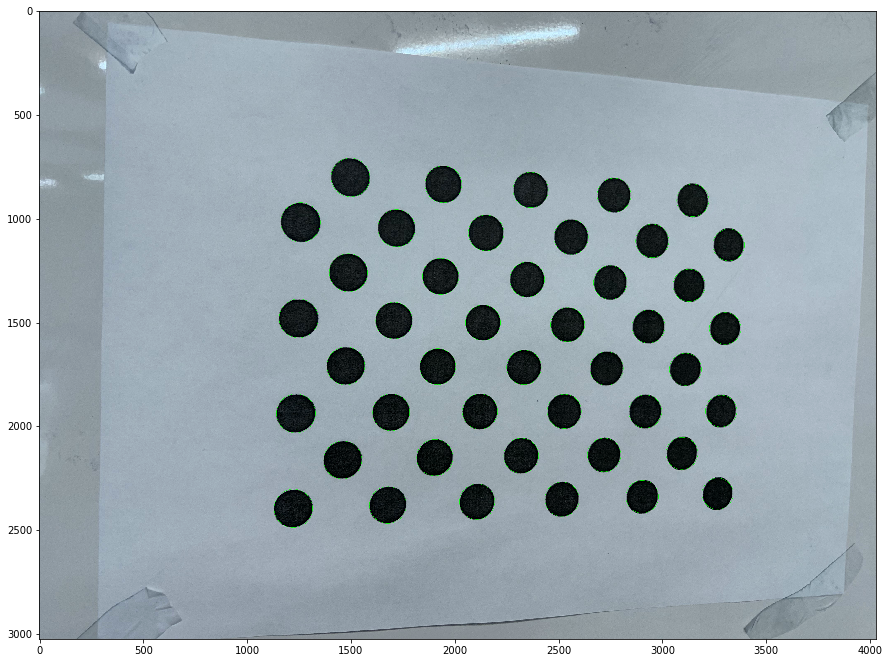

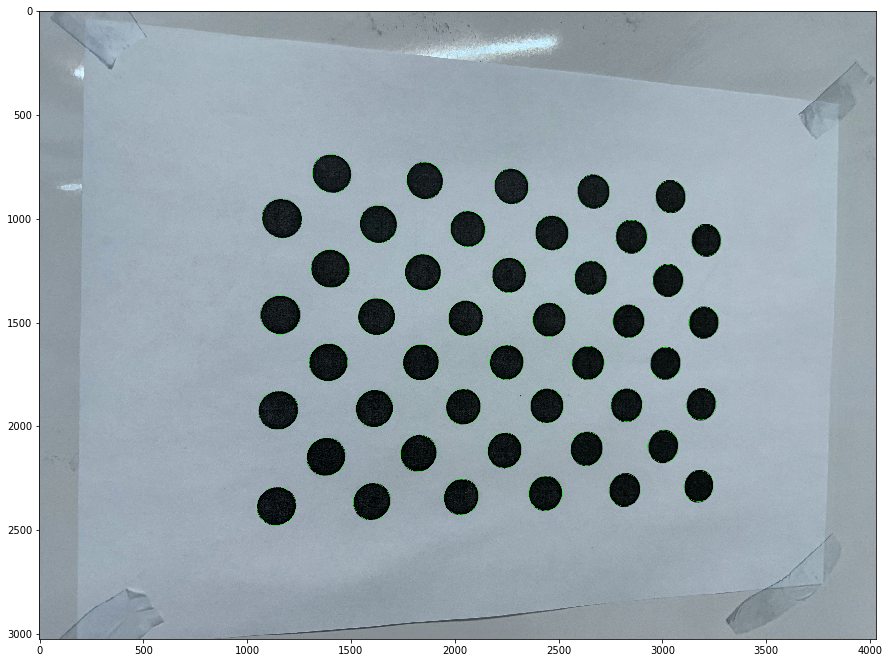

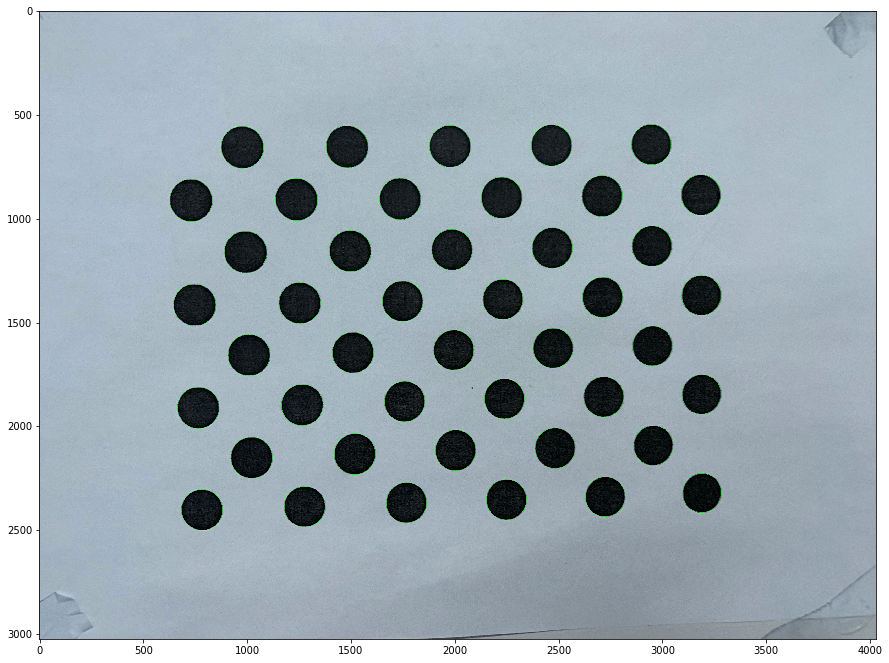

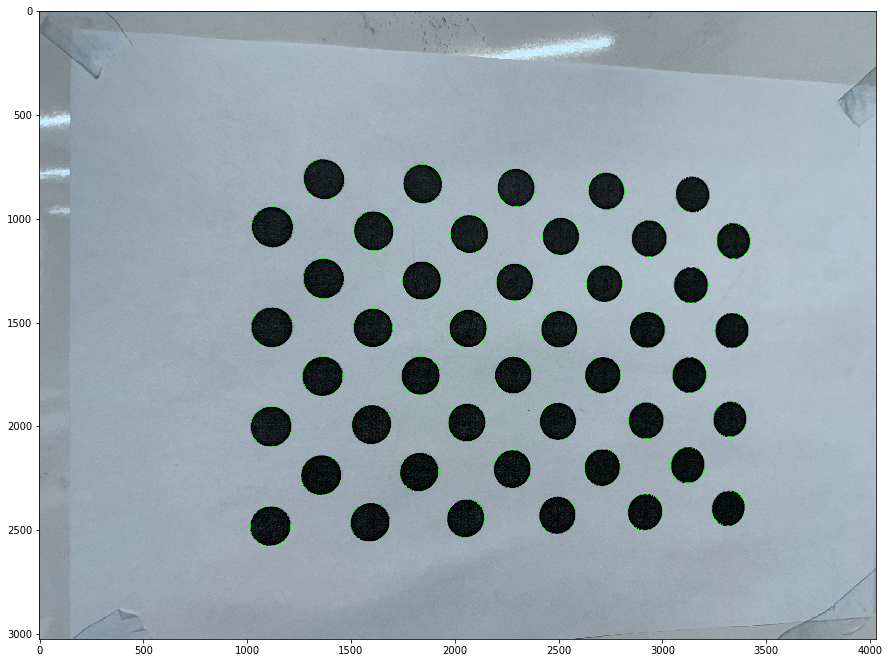

In [49]:
objpoints = None # 3d point in real world space
imgpoints = None # 2d points in image plane.
for f in range(1614,1635):
  filename = 'IMG_{}.png'.format(f)
  img = cv2.imread(filename)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  keypoints = blobDetector.detect(gray)
  im_with_keypoints = cv2.drawKeypoints(img, keypoints, np.array([]), (0,255,0), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  ret, corners = cv2.findCirclesGrid(gray, (grid_row_size,grid_col_size),
                        flags = cv2.CALIB_CB_ASYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING,
                                     blobDetector = blobDetector)   # Find the circle grid
  
  plt.figure(figsize=figsize)
  plt.imshow(im_with_keypoints)
#   print(keypoints)
  if corners is not None and ret:
    objpoints = np.array([objp]) if objpoints is None else np.append(objpoints, [objp], axis = 0)
    imgpoints = np.array([corners]) if imgpoints is None else np.append(imgpoints, [corners], axis = 0)
  else:
    print('Skip ' + filename)


print(objpoints.shape)
print(imgpoints.shape)
(i1, i2, i3, i4) = imgpoints.shape;
imgpoints = imgpoints.reshape([i1, i2, i4])
print(imgpoints.shape)
  
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print(mtx)
print(dist)



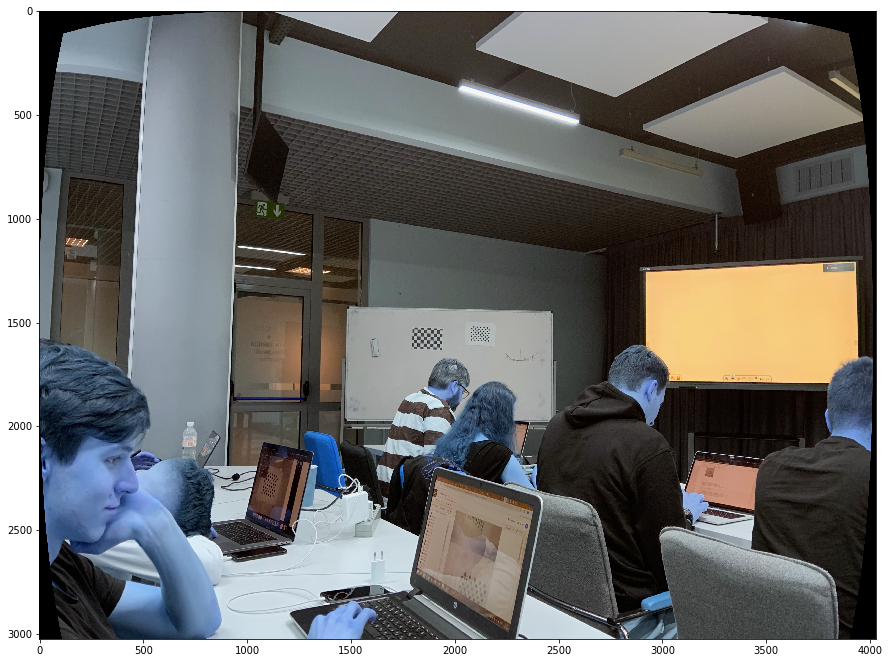

In [50]:
# dist = np.array([0,0,0,0,0])
test = cv2.imread("TEST.png")

(w,h) = test.shape[:2]
newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
dst = cv2.undistort(test, mtx, dist, None, newcameramtx)
# mapx,mapy = cv2.initUndistortRectifyMap(mtx,dist,None,newcameramtx,(w,h),5)
# dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

# # crop the image
# x,y,w,h = roi
# dst = dst[y:y+h, x:x+w]
# dst = cv2.resize(dst, (0,0), fx=0.25, fy=0.25) 
plt.figure(figsize=figsize)
plt.imshow(dst)